## Notebook to observe the variation in decoding abilities across subjects

In [1]:
import pickle

from hparams import HParams
from hps import Hyperparams
from vae import VAE

from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.manifold import TSNE
import seaborn as sns
import nltk
from nltk.corpus import stopwords
import string
# from wordcloud import WordCloud

import numpy as np
import os
import glob
from os.path import join as opj
import h5py  
import matplotlib.pyplot as plt
import pandas as pd
import nibabel as nib
from scipy.io import loadmat
import torch
from torch.utils.data import Dataset, Subset, DataLoader
import json
from PIL import Image
# from diffusers import VersatileDiffusionPipeline
# from diffusers import VersatileDiffusionDualGuidedPipeline
from diffusers.models import AutoencoderKL, Transformer2DModel, UNet2DConditionModel
# from versatile_diffusion_dual_guided import VersatileDiffusionDualGuidedPipeline
from versatile_diffusion_dual_guided_fake_images import VersatileDiffusionDualGuidedFromCLIPEmbeddingPipeline
from autoencoder import *
from torchsummary import summary
import torchvision
import tqdm
from sklearn.linear_model import Ridge
import pickle
import wandb


from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from diffusers.utils import (
    randn_tensor,
)
from decoding import *

# from yellowbrick.cluster import KElbowVisualizer

/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_aligned_dataset(source_sub_idx,target_sub_idx,method="ridge",split="comparison",fraction=10):
    
    ## LAVORARE QUI
    
    assert method in ["ridge","hyper","randomhyper", "anat"], 'method should be in ["ridge","hyper","randomhyper", "anat"]'
    assert split in ["comparison","test","train"], 'split should be in ["comparison","test","train"]'
    assert fraction in [10,25,50,100], 'fraction should be 10,25, 50 or 100'
    
    
    # load stimuli
    if split=="comparison":
        imgs_data=f"/home/matteo/data/NSD/processed_roi/subj0{source_sub_idx}/aligned_to_subj0{target_sub_idx}/nsd_comparison_stim_sub{source_sub_idx}.npy"
    elif split=="test": 
        imgs_data=f"/home/matteo/data/NSD/processed_roi/subj0{source_sub_idx}/aligned_to_subj0{target_sub_idx}/nsd_test_stim_sub{source_sub_idx}.npy"
    elif split=="train":
        imgs_data=opj(base_path,"processed_roi",f"subj0{source_sub_idx}",f"MNI/nsd_train_stim_sub{source_sub_idx}.npy")

    # load aligned data
    
    if method=="anat":
        if split=="train":
            data=opj(base_path,"processed_roi",f"subj0{source_sub_idx}",f"MNI/nsd_train_fmriavg_nsdgeneral_sub{source_sub_idx}.npy")
        else:
            data=opj(f"/home/matteo/data/NSD/processed_roi/subj0{source_sub_idx}",f"aligned_to_subj0{target_sub_idx}/nsd_{split}_NOTALIGNED_fmriavg_nsdgeneral_sub{source_sub_idx}.npy") 
    else:
    
        data=opj(f"/home/matteo/data/NSD/processed_roi/subj0{source_sub_idx}",f"aligned_to_subj0{target_sub_idx}/nsd_{split}_fmriavg_nsdgeneral_sub{source_sub_idx}_{method}_fraction-{fraction}.npy")
        
    
    
    return data,imgs_data

In [3]:
def get_dataset(source_sub_idx,target_sub_idx,method="ridge",split="comparison",fraction=10):

            
    ## Remove useful indices 
    indices=[25,31,68,121,126,318,384,492,531,606,702,860]

    indices2=[70,116,165,261,278,363,451,774]
    indices3=[41,205,230,411,428,446,502,777]
    extra=[95,905]
    comparison_indices=indices+indices2+indices3+extra

    align_indices=[i for i in  range(982) if i not in comparison_indices]
    
    tr=torchvision.transforms.ToTensor()

    if source_sub_idx!=target_sub_idx:
        
                
        base_path="/home/matteo/data/NSD"
        processed_data=opj(base_path,"processed_roi",f"subj0{source_sub_idx}")
        
        data,imgs_data=get_aligned_dataset(source_sub_idx,target_sub_idx,method,split,fraction)
        
            # load captions

        if split=="train":
            captions_data=opj(processed_data, f"MNI/nsd_train_cap_sub{source_sub_idx}.npy")
            dataset=NSDDataset(data,imgs_data,captions_data,transforms=tr)


        elif split=="comparison":
            captions_data=opj(processed_data, f"MNI/nsd_test_cap_sub{source_sub_idx}.npy")
            
            dataset=NSDDataset(data,imgs_data,captions_data,transforms=tr)
        
        elif split=="test":
            captions_data=opj(processed_data, f"MNI/nsd_test_cap_sub{source_sub_idx}.npy")
            
            dataset=NSDDataset(data,imgs_data,captions_data,transforms=tr)

    
    else:    
        
        base_path="/home/matteo/data/NSD"
        processed_data=opj(base_path,"processed_roi",f"subj0{source_sub_idx}")
        
        print("source_idx and target_idx are the same")
        
        if split=="train":
            data=opj(processed_data,f"MNI/nsd_train_fmriavg_nsdgeneral_sub{target_sub_idx}.npy")
            imgs_data=opj(processed_data,f"MNI/nsd_train_stim_sub{target_sub_idx}.npy")
            captions_data=opj(processed_data, f"MNI/nsd_train_cap_sub{target_sub_idx}.npy")
           
            dataset=NSDDataset(data,imgs_data,captions_data,transforms=tr)


        elif split=="comparison":
            data=opj(processed_data,f"MNI/nsd_test_fmriavg_nsdgeneral_sub{target_sub_idx}.npy")
            imgs_data=opj(processed_data,f"MNI/nsd_test_stim_sub{target_sub_idx}.npy")
            captions_data=opj(processed_data, f"MNI/nsd_test_cap_sub{target_sub_idx}.npy")
            
            dataset=NSDDataset(data,imgs_data,captions_data,transforms=tr)
            dataset=torch.utils.data.Subset(dataset,comparison_indices)
            
        elif split=="test":
            data=opj(processed_data,f"MNI/nsd_test_fmriavg_nsdgeneral_sub{target_sub_idx}.npy")
            imgs_data=opj(processed_data,f"MNI/nsd_test_stim_sub{target_sub_idx}.npy")
            captions_data=opj(processed_data, f"MNI/nsd_test_cap_sub{target_sub_idx}.npy")
            
            dataset=NSDDataset(data,imgs_data,captions_data,transforms=tr)
            dataset=torch.utils.data.Subset(dataset,align_indices)
        
    return dataset
        

In [25]:


all_imgs=[]
for target_sub_idx in [1,2,5,7]:
    print(f"target: {target_sub_idx}")

    sub=f"subj0{target_sub_idx}"

    subj_path=opj("/home/matteo/explore_NSD_MNI","models",sub)
    brain_decoder=BrainDiffuserPretrainedDecoder(subj_path=subj_path,device="cuda:0")

    mean=torch.load(opj(subj_path,"train_fmri_mean.pt"))
    std=torch.load(opj(subj_path,"train_fmri_std.pt"))

    generated=[]

    for source_idx in [1,2,5,7]:

        dataset=get_dataset(source_idx,target_sub_idx,method="ridge",split="comparison", fraction=100)

        BS=4


        # other_dataset=NSDDataset(data,imgs_data,captions_test_data,transforms=tr)
        dataloader=DataLoader(dataset,batch_size=BS,shuffle=False)

        x,y,c=next(iter(dataloader))
        x_norm=torch.nan_to_num((x-mean)/std)
        image_generated,guess_img=brain_decoder.decode(x_norm)
        generated.append(image_generated)
    
    all_imgs.append(generated)
    
#I should end up with a big matrix (target, source, imgs, width, height, channels)
    
    # gen_tmp=[]
#     for x,y,c in dataloader:
    
#         x_norm=torch.nan_to_num((x-mean)/std)
#         image_generated,guess_img=brain_decoder.decode(x_norm)
#         gen_tmp+=image_generated
#     generated.append(gen_tmp)

target: 1
Loading pretrained deep learning backbones


Fetching 17 files: 100%|█████████████████████| 17/17 [00:00<00:00, 66825.84it/s]


Loading pretrained brain to feature models
loading brain to latent models


/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/sklearn/base.py:347: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.2.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


loading brain to img embeddings models
loading brain to txt embeddings models
loading adjust values
loading predicted values for adjusting
source_idx and target_idx are the same


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 268.54it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.36it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.34it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 77/77 [00:25<00:00,  3.03it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.33it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.30it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 77/77 [00:07<00:00, 10.44it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(0.9843)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.33it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.30it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.29it/s]


[INFO] Final reconstrution 4/4


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 291.28it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.33it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.31it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.30it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.28it/s]


target: 2
Loading pretrained deep learning backbones


Fetching 17 files: 100%|█████████████████████| 17/17 [00:00<00:00, 30867.17it/s]


Loading pretrained brain to feature models
loading brain to latent models
loading brain to img embeddings models
loading brain to txt embeddings models
loading adjust values
loading predicted values for adjusting


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 271.83it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.37it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.34it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.34it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


source_idx and target_idx are the same


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 261.64it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.31it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.31it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.30it/s]


[INFO] Final reconstrution 4/4


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 269.24it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.27it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.25it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.25it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 77/77 [00:05<00:00, 13.23it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.27it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.25it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.22it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.22it/s]


target: 5
Loading pretrained deep learning backbones


Fetching 17 files: 100%|█████████████████████| 17/17 [00:00<00:00, 30187.62it/s]


Loading pretrained brain to feature models
loading brain to latent models
loading brain to img embeddings models
loading brain to txt embeddings models
loading adjust values
loading predicted values for adjusting


100%|███████████████████████████████████████████| 77/77 [00:01<00:00, 69.43it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.35it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.33it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 77/77 [00:20<00:00,  3.79it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(0.9961)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.28it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.27it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.26it/s]


source_idx and target_idx are the same


100%|███████████████████████████████████████████| 77/77 [00:12<00:00,  6.14it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.29it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.28it/s]


[INFO] Final reconstrution 4/4


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 286.80it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.32it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.29it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.28it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.27it/s]


target: 7
Loading pretrained deep learning backbones


Fetching 17 files: 100%|█████████████████████| 17/17 [00:00<00:00, 65960.38it/s]


Loading pretrained brain to feature models
loading brain to latent models
loading brain to img embeddings models
loading brain to txt embeddings models
loading adjust values
loading predicted values for adjusting


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 290.03it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.36it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.34it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.34it/s]


[INFO] Final reconstrution 4/4


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 244.21it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.31it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.29it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.27it/s]


[INFO] Final reconstrution 4/4


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 238.54it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.26it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.24it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.23it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.21it/s]


source_idx and target_idx are the same


100%|██████████████████████████████████████████| 77/77 [00:00<00:00, 124.29it/s]
/home/matteo/anaconda3/envs/deep/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(1.)
[INFO] Final reconstrution 1/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.26it/s]


[INFO] Final reconstrution 2/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.23it/s]


[INFO] Final reconstrution 3/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.22it/s]


[INFO] Final reconstrution 4/4


100%|███████████████████████████████████████████| 37/37 [00:05<00:00,  7.20it/s]


In [26]:
big_matrix=np.array(all_imgs)

In [27]:
big_matrix.shape

(4, 4, 4, 512, 512, 3)

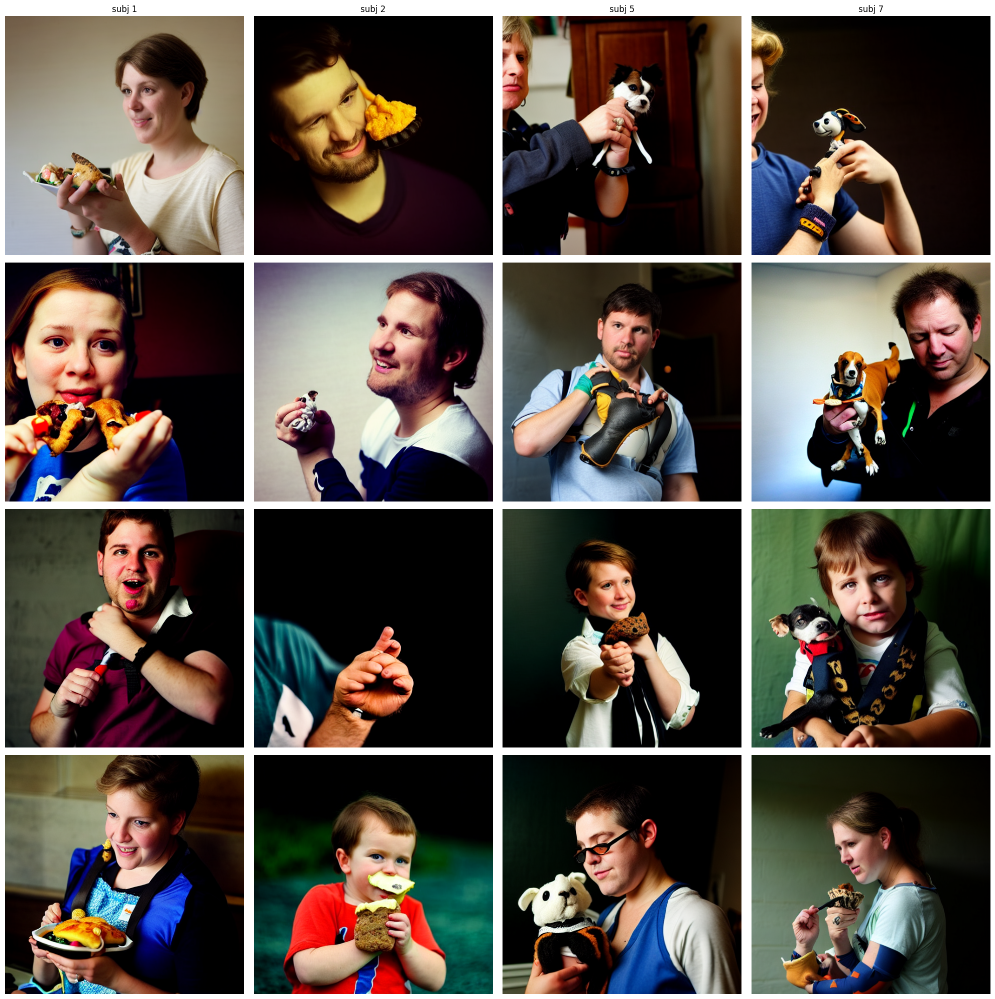

In [54]:
img_idx=3
subject_indices=[1,2,5,7]
fig, axs=plt.subplots(4,4,figsize=(20,20))

for i in range(4):
    
    for j in range(4):
        axs[i,j].imshow(big_matrix[i,j,img_idx])
        axs[i, j].axis('off')  # Turn off axis
        axs[i, j].xaxis.set_ticks([])  # Remove x-axis ticks
        axs[i, j].yaxis.set_ticks([])  # Remove y-axis ticks
        
        if i==0:
            axs[i,j].set_title(f"subj {subject_indices[j]}")
            
        if j==0:
            axs[i,j].set_ylabel(f"subj {subject_indices[i]}")

      
# plt.subplots_adjust(top=1.3, left=-0.5)  # Adjust the top margin for the suptitle
plt.tight_layout()

plt.savefig(f"multisubject_matrix_fig_{img_idx}.png")

# fig.supylabel("Decoder trained on",fontsize=14)
# fig.suptitle("Subject aligned on",fontsize=14)


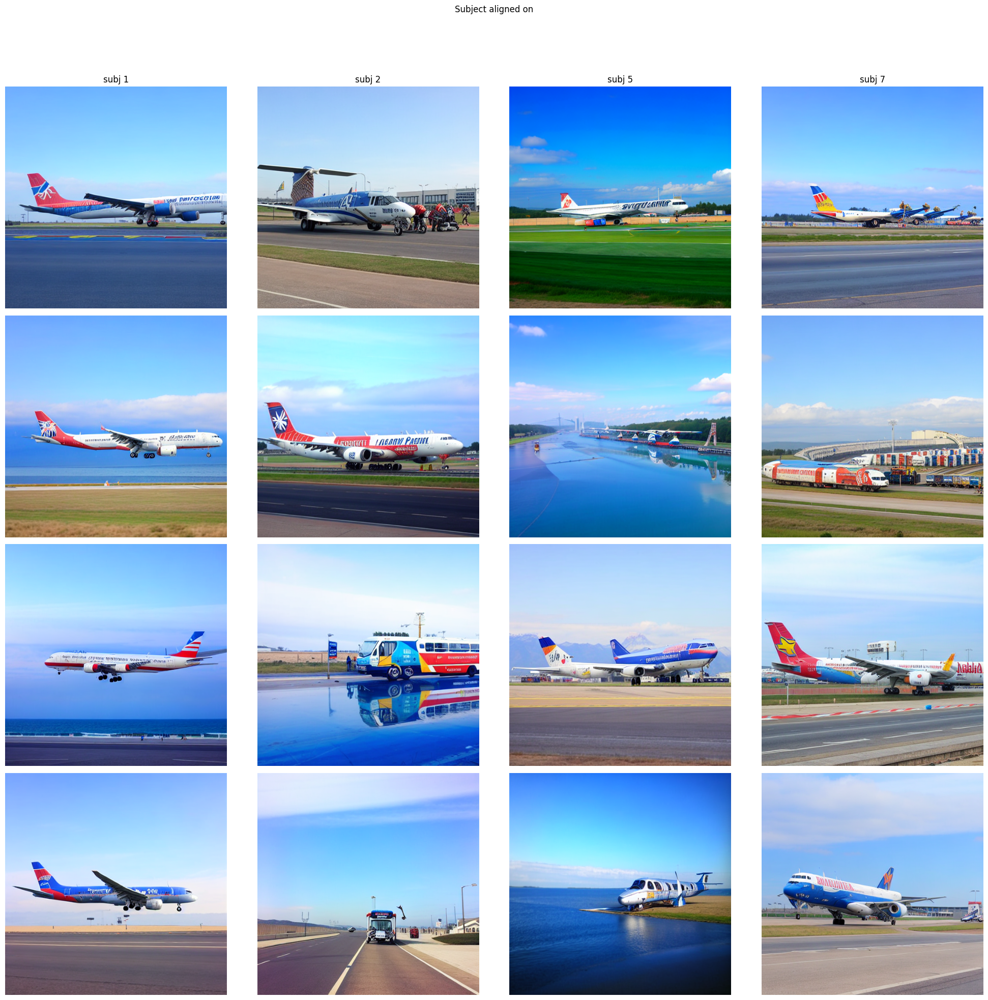

In [34]:

img_idx = 0
subject_indices = [1, 2, 5, 7]

fig, axs = plt.subplots(4, 4, figsize=(20, 20))

for i in range(4):
    for j in range(4):
        axs[i, j].imshow(big_matrix[i, j, img_idx])
        
        if i == 0:
            axs[i, j].set_title(f"subj {subject_indices[j]}")
            
        if j == 0:
            axs[i, j].set_ylabel(f"subj {subject_indices[i]}")
        
        axs[i, j].axis('off')  # Turn off axis
        axs[i, j].xaxis.set_ticks([])  # Remove x-axis ticks
        axs[i, j].yaxis.set_ticks([])  # Remove y-axis ticks

fig.suptitle("Subject aligned on")  # Set the main title

# Adjust spacing between subplots
plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Adjust the top margin for the suptitle

plt.show()  # Display the plot
